### Instalando Bibliotecas

In [135]:
%pip install pandas
%pip install matplotlib
%pip install scikit-learn
%pip install numpy
%pip install seaborn
%pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


### Importando Bibliotecas Gerais

In [136]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Utilizando Dado de Classificação de Linhas de Trasmissão

- https://www.kaggle.com/datasets/esathyaprakash/electrical-fault-detection-and-classification

In [137]:
data = pd.read_csv('./data/kaggle/classData.csv')
data.describe()

,G,C,B,A,Ia,Ib,Ic,Va,Vb,Vc
count,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000,7861.000000
mean,0.432006,0.411271,0.555527,0.571429,13.721194,-44.845268,34.392394,-0.007667,0.001152,0.006515
std,0.495387,0.492095,0.496939,0.494903,464.741671,439.269195,371.107412,0.289150,0.313437,0.307897
min,0.000000,0.000000,0.000000,0.000000,-883.542316,-900.526951,-883.357762,-0.620748,-0.608016,-0.612709
25%,0.000000,0.000000,0.000000,0.000000,-119.802518,-271.845947,-61.034219,-0.130287,-0.159507,-0.215977
50%,0.000000,0.000000,1.000000,1.000000,2.042805,5.513317,-4.326711,-0.005290,0.001620,0.009281
75%,1.000000,1.000000,1.000000,1.000000,227.246377,91.194282,49.115141,0.111627,0.153507,0.239973
max,1.000000,1.000000,1.000000,1.000000,885.738571,889.868884,901.274261,0.595342,0.627875,0.600179


### Transformando Colunas 'G'/'C'/'B'/'A' em classes 0,1,2,3,4,5 na coluna 'faultType'

In [138]:

df=data.copy()
df['faultType'] = df['G'].astype(str) + df['C'].astype(str) + df['B'].astype(str) + df['A'].astype(str)
# Define a dictionary for replacement values
replacement_dict = {
    '0000': 0, #NoFault #2365
    '1001': 1, #Fault AG #1129
    '0110': 2, #Fault CB #1004
    '1011': 3, #Fault ABG #1134
    '0111': 4, #Fault CBA #1096
    '1111': 5  #Fault ABCG #1133
}

# Replace values in the 'fault_type' column based on the dictionary
df['faultType'] = df['faultType'].replace(replacement_dict)
df['faultType'] = df['faultType'].astype(int)



C:\Users\b.machado.de.souza\AppData\Local\Temp\ipykernel_18532\4250194577.py:14: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['faultType'] = df['faultType'].replace(replacement_dict)


### Eliminando Colunas não utilizadas

In [139]:
data = data.drop(['G','A','B','C'],axis=1)

### Criando dataset de atributos(X) e de saídas(y)

In [140]:
X = data.copy()
y = df['faultType']

### Balanceado os dados

In [141]:
from imblearn.over_sampling import RandomOverSampler

oversampler = RandomOverSampler(sampling_strategy='auto')
X_resampled, y_resampled = oversampler.fit_resample(X, y)

In [142]:
X_resampled.describe()
y_resampled.describe()

count    14190.000000
mean         2.500000
std          1.707885
min          0.000000
25%          1.000000
50%          2.500000
75%          4.000000
max          5.000000
Name: faultType, dtype: float64

### Dividindo os dados em dados de treinamento e validação

In [143]:
# # Import necessary libraries
from sklearn.model_selection import train_test_split

X = data.copy()
y = df['faultType']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3)

### Modelo DT


In [147]:
best_params_dt={
    'criterion': 'entropy',
    'min_samples_leaf': 2,
    'min_samples_split': 2,
    'splitter': 'best'
}

In [162]:
from sklearn.tree import DecisionTreeClassifier
dt_clf = DecisionTreeClassifier(**best_params_dt)
dt_clf = dt_clf.fit(X_train, y_train)
predictions_dt = dt_clf.predict(X_test)
precdict_dt = dt_clf.predict_proba(X_test)


In [163]:
from sklearn.metrics import accuracy_score,precision_score, recall_score

accuracy_score = accuracy_score(y_test, predictions_dt)
precision_score = precision_score(y_test, predictions_dt, average='macro')
recall_score = recall_score(y_test, predictions_dt, average='macro')
print(f"""
      metricas gerais: 
      accuracy_score = {accuracy_score} ;
      precision_score = {precision_score} ;
      accuracy_score = {recall_score} ; 
      """)


      metricas gerais: 
      accuracy_score = 0.9520789288231148 ;
      precision_score = 0.9532573385710674 ;
      accuracy_score = 0.953190571496369 ; 
      


In [164]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_dt,digits=4, target_names=['0','1','2','3','4','5']))

              precision    recall  f1-score   support

           0     1.0000    0.9986    0.9993       691
           1     1.0000    1.0000    1.0000       726
           2     0.9985    1.0000    0.9993       686
           3     1.0000    1.0000    1.0000       702
           4     0.8481    0.8752    0.8614       721
           5     0.8729    0.8454    0.8589       731

    accuracy                         0.9521      4257
   macro avg     0.9533    0.9532    0.9532      4257
weighted avg     0.9522    0.9521    0.9521      4257



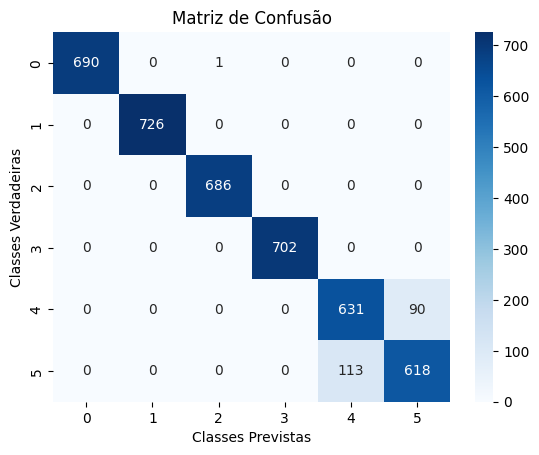

In [165]:
from sklearn.metrics import confusion_matrix
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions_dt, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()

<Axes: xlabel='Feature'>

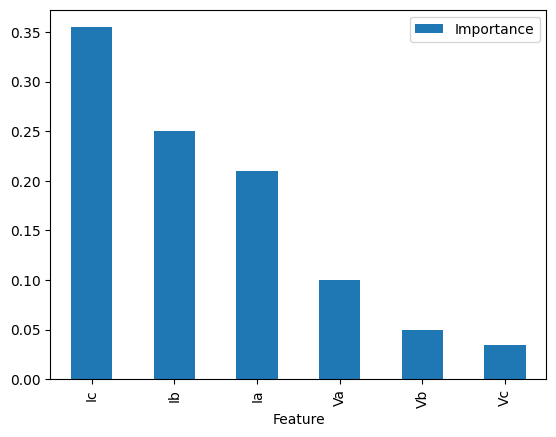

In [166]:
# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({'Feature':  X.columns, 'Importance': dt_clf.feature_importances_})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False, ignore_index=True)

feature_importance_df.head(10).plot(kind='bar',x='Feature',y='Importance')

In [81]:
from sklearn import tree
from matplotlib import pyplot as plt

fig = plt.figure(figsize=(200,200
                          ))
_ = tree.plot_tree(dt_clf, 
                   feature_names=X.columns,  
                   class_names={0:'No Fault', 1:'LG',2:'LL',3:'LLG',4:'LLL',5:'LLLG'},
                   filled=True,
                  fontsize=12)

### Modelo SVM

In [153]:
best_params_svn = {
    'C': 30000, 
    'gamma': 'scale', 
    'kernel': 'rbf'
}

In [168]:
from sklearn import svm
svm_clf = svm.SVC(**best_params_svn)
svm_clf = svm_clf.fit(X_train, y_train)
predictions_svm = svm_clf.predict(X_test)

In [169]:
from sklearn.metrics import accuracy_score,precision_score, recall_score
accuracy_score = accuracy_score(y_test, predictions_svm)
precision_score = precision_score(y_test, predictions_svm, average='macro')
recall_score = recall_score(y_test, predictions_svm, average='macro')
print(f"""
      metricas gerais: 
      accuracy_score = {accuracy_score} ;
      precision_score = {precision_score} ;
      accuracy_score = {recall_score} ; 
      """)



      metricas gerais: 
      accuracy_score = 0.9753347427766033 ;
      precision_score = 0.9754169508253541 ;
      accuracy_score = 0.9755796582197314 ; 
      


In [170]:
print(classification_report(y_test, predictions_svm,digits=4, target_names=['0', '1','2','3','4','5']))

              precision    recall  f1-score   support

           0     0.9719    1.0000    0.9857       691
           1     0.9932    0.9986    0.9959       726
           2     0.9896    0.9708    0.9801       686
           3     0.9789    0.9915    0.9851       702
           4     0.9538    0.9459    0.9499       721
           5     0.9651    0.9466    0.9558       731

    accuracy                         0.9753      4257
   macro avg     0.9754    0.9756    0.9754      4257
weighted avg     0.9753    0.9753    0.9752      4257



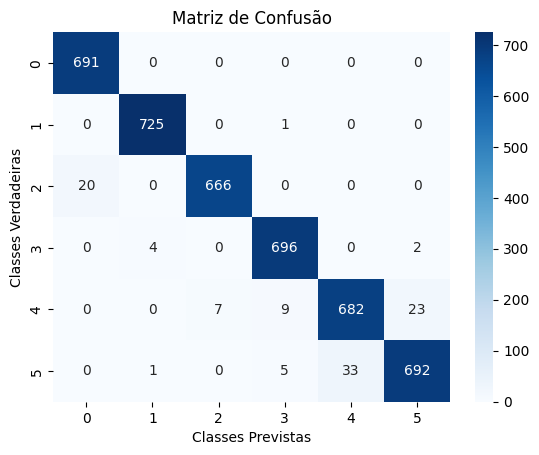

In [171]:
from sklearn.metrics import confusion_matrix

# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions_svm, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()


### Modelo RF

In [172]:
best_params_rf = {   
 'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 11,
 'min_samples_split': 2,
 'n_estimators': 100
 }

In [173]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(**best_params_rf)
rf_clf.fit(X_train, y_train)
predictions_rf = rf_clf.predict(X_test)

In [174]:
from sklearn.metrics import accuracy_score,precision_score, recall_score
accuracy_score = accuracy_score(y_test, predictions_rf)
precision_score = precision_score(y_test, predictions_rf, average='macro')
recall_score = recall_score(y_test, predictions_rf, average='macro')
print(f"""
      metricas gerais: 
      accuracy_score = {accuracy_score} ;
      precision_score = {precision_score} ;
      accuracy_score = {recall_score} ; 
      """)



      metricas gerais: 
      accuracy_score = 0.8705661263800799 ;
      precision_score = 0.8738360550601131 ;
      accuracy_score = 0.8735882180239346 ; 
      


In [175]:
print(classification_report(y_test, predictions_rf,digits=4, target_names=['0', '1','2','3','4','5']))

              precision    recall  f1-score   support

           0     1.0000    0.9986    0.9993       691
           1     1.0000    1.0000    1.0000       726
           2     0.9985    1.0000    0.9993       686
           3     1.0000    1.0000    1.0000       702
           4     0.6092    0.6616    0.6343       721
           5     0.6353    0.5814    0.6071       731

    accuracy                         0.8706      4257
   macro avg     0.8738    0.8736    0.8733      4257
weighted avg     0.8709    0.8706    0.8704      4257



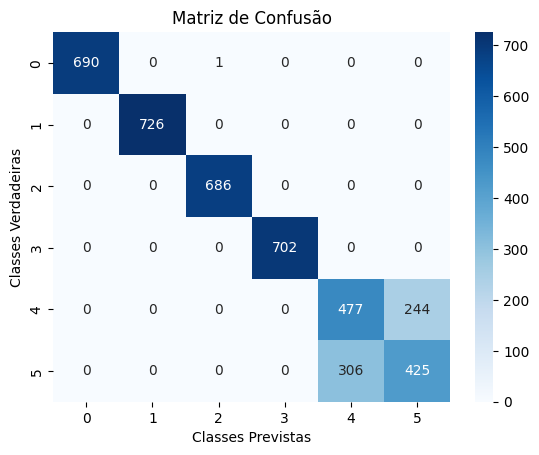

In [176]:
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions_rf, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()


<Axes: xlabel='Feature'>

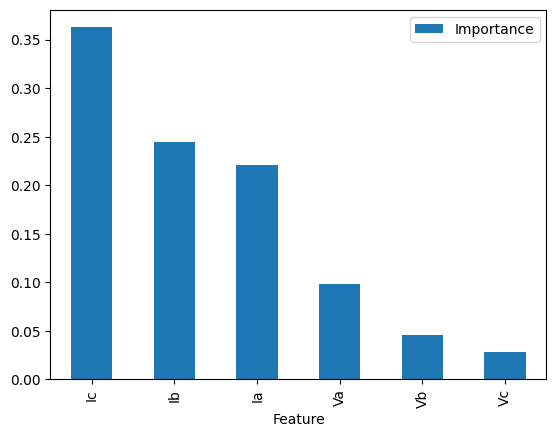

In [177]:
# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({'Feature':  X.columns, 'Importance': rf_clf.feature_importances_})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False, ignore_index=True)

feature_importance_df.head(10).plot(kind='bar',x='Feature',y='Importance')

### Modelo KNN

In [128]:
best_params = {
    'metric': 'euclidean', 
    'n_neighbors': 1, 
    'p': 2, 
    'weights': 'distance'
}

In [178]:
from sklearn.neighbors import KNeighborsClassifier
knn_clf = KNeighborsClassifier(**best_params)
knn_clf.fit(X_train, y_train)
predictions_knn = knn_clf.predict(X_test)

In [179]:
from sklearn.metrics import accuracy_score,precision_score, recall_score
accuracy_score = accuracy_score(y_test, predictions_knn)
precision_score = precision_score(y_test, predictions_knn, average='macro')
recall_score = recall_score(y_test, predictions_knn, average='macro')
print(f"""
      metricas gerais: 
      accuracy_score = {accuracy_score} ;
      precision_score = {precision_score} ;
      accuracy_score = {recall_score} ; 
      """)


      metricas gerais: 
      accuracy_score = 0.9642941038289875 ;
      precision_score = 0.9650810338213253 ;
      accuracy_score = 0.9650333328784616 ; 
      


In [180]:
print(classification_report(y_test, predictions_knn,digits=4, target_names=['0', '1','2','3','4','5']))

              precision    recall  f1-score   support

           0     0.9971    1.0000    0.9986       691
           1     0.9932    1.0000    0.9966       726
           2     1.0000    0.9971    0.9985       686
           3     0.9986    0.9915    0.9950       702
           4     0.9003    0.9015    0.9009       721
           5     0.9014    0.9001    0.9008       731

    accuracy                         0.9643      4257
   macro avg     0.9651    0.9650    0.9651      4257
weighted avg     0.9643    0.9643    0.9643      4257



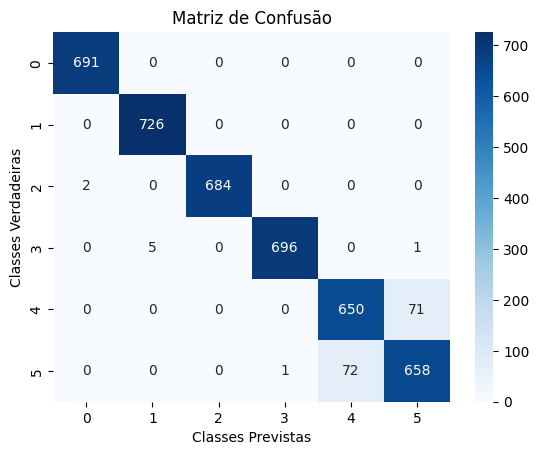

In [181]:
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions_knn, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()